# Improved DINOv2 Fisheye Semantic Segmentation (Syn→Real-ready Baseline)

This notebook is an **improved, self-contained** version of the original group notebook:
- fixes train/val augmentation split bug
- adds **global** mIoU computation (confusion-matrix based)
- supports **1000-sample training** with **75/25** split
- makes label mapping explicit and reproducible (RGB→class)
- upgrades decoder to a **multi-layer DINOv2 feature fusion** head (SegFormer-like, but lightweight)
- uses **GroupNorm** instead of BatchNorm (better for small batch sizes)
- adds optional **class-weighted CE + Dice** and safer augmentations

In [5]:
import os
import json
import math
import random
import shutil
from dataclasses import dataclass, asdict
from pathlib import Path
from typing import List, Tuple, Optional, Dict, Sequence

import numpy as np
import pandas as pd
from PIL import Image
import cv2
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from tqdm.auto import tqdm

In [6]:
# ============================================================
# 1. Seed + device
# ============================================================
SEED = 42

def seed_everything(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)

seed_everything(SEED)

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("DEVICE =", DEVICE)

# ============================================================
# 2. Config
# ============================================================
@dataclass
class Config:
    # ---------- paths ----------
    SYN_ROOT: str = "/kaggle/input/datasets/stellarzhou/synwoodscape-rgb-gtlabels/synwoodscape-rgb-gtlabels"
    REAL_ROOT: str = "/kaggle/input/datasets/stellarzhou/woodscape-real-zip/woodscape_real copie"

    # ---------- image ----------
    target_size: Tuple[int, int] = (518, 518)   # (W, H)
    file_ext: str = ".png"
    ignore_index: int = 255

    # ---------- label space ----------
    num_classes: int = 25   # keep same as your current code

    # ---------- model (SAME MODEL) ----------
    model_name: str = "dinov2_vits14"
    n_intermediate_layers: int = 4
    decoder_dim: int = 256
    dropout: float = 0.1
    freeze_backbone: bool = True

    # ---------- fast sweep settings ----------
    batch_size: int = 4
    epochs: int = 6
    steps_per_epoch: int = 60
    lr: float = 2e-4
    weight_decay: float = 1e-4
    grad_accum_steps: int = 2
    use_amp: bool = True

    use_dice: bool = True
    dice_weight: float = 0.3
    use_class_weights: bool = True

    # ---------- data split ----------
    real_train_ratio: float = 0.8

    # ---------- speed control ----------
    max_syn_samples: int = 800
    max_real_train_samples: int = 1200
    max_real_test_samples_for_sweep: int = 400  # use subset for ratio sweep
    max_real_test_samples_final: Optional[int] = None  # None = full real test for final visualization

    # ---------- candidate ratios ----------
    candidate_ratios: Tuple[float, ...] = (0.0, 0.1, 0.25, 0.4)

    # ---------- output ----------
    out_dir: str = "./ratio_sweep_outputs"

cfg = Config()
os.makedirs(cfg.out_dir, exist_ok=True)

IMAGENET_MEAN = np.array([0.485, 0.456, 0.406], dtype=np.float32)
IMAGENET_STD  = np.array([0.229, 0.224, 0.225], dtype=np.float32)

# ============================================================
# 3. Data utilities
# ============================================================
def list_pairs(
    image_dir: str,
    mask_dir: str,
    img_exts: Sequence[str] = (".png", ".jpg", ".jpeg", ".webp"),
    mask_ext: str = ".png"
) -> List[Tuple[Path, Path]]:
    image_dir = Path(image_dir)
    mask_dir = Path(mask_dir)

    img_files = []
    for ext in img_exts:
        img_files.extend(image_dir.rglob(f"*{ext}"))
    img_files = sorted(img_files)

    pairs = []
    for img_path in img_files:
        rel = img_path.relative_to(image_dir)

        candidates = [
            mask_dir / rel.with_suffix(mask_ext),
            mask_dir / rel,
            mask_dir / img_path.name,
            mask_dir / (img_path.stem + mask_ext)
        ]

        mask_path = None
        for c in candidates:
            if c.exists():
                mask_path = c
                break

        if mask_path is not None:
            pairs.append((img_path, mask_path))

    return pairs

def split_pairs(pairs, train_ratio=0.8, seed=42):
    idx = np.arange(len(pairs))
    rng = np.random.default_rng(seed)
    rng.shuffle(idx)
    n_train = int(len(pairs) * train_ratio)
    train_pairs = [pairs[i] for i in idx[:n_train]]
    test_pairs  = [pairs[i] for i in idx[n_train:]]
    return train_pairs, test_pairs

def subset_pairs(pairs, max_n=None, seed=42):
    if max_n is None or max_n <= 0 or len(pairs) <= max_n:
        return pairs
    rng = np.random.default_rng(seed)
    idx = rng.choice(len(pairs), size=max_n, replace=False)
    return [pairs[i] for i in idx]

DEVICE = cuda


In [7]:
# ============================================================
# 4. Load paths and build pairs
# ============================================================
SYN_ROOT  = Path(cfg.SYN_ROOT)
REAL_ROOT = Path(cfg.REAL_ROOT)

syn_image_dir  = SYN_ROOT / "rgb_images"
syn_mask_dir   = SYN_ROOT / "gtLabels"

real_image_dir = REAL_ROOT / "rgb_images"
real_mask_dir  = REAL_ROOT / "semantic_annotations" / "gtLabels"

print("syn_image_dir:", syn_image_dir.exists(), syn_image_dir)
print("syn_mask_dir :", syn_mask_dir.exists(), syn_mask_dir)
print("real_image_dir:", real_image_dir.exists(), real_image_dir)
print("real_mask_dir :", real_mask_dir.exists(), real_mask_dir)

assert syn_image_dir.exists() and syn_mask_dir.exists()
assert real_image_dir.exists() and real_mask_dir.exists()

syn_pairs  = list_pairs(str(syn_image_dir), str(syn_mask_dir), mask_ext=cfg.file_ext)
real_pairs = list_pairs(str(real_image_dir), str(real_mask_dir), mask_ext=cfg.file_ext)

print("SYN pairs :", len(syn_pairs))
print("REAL pairs:", len(real_pairs))

real_train_pairs, real_test_pairs = split_pairs(real_pairs, train_ratio=cfg.real_train_ratio, seed=SEED)
syn_train_pairs, _ = split_pairs(syn_pairs, train_ratio=0.98, seed=SEED)

# speed caps
syn_train_pairs = subset_pairs(syn_train_pairs, cfg.max_syn_samples, seed=SEED)
real_train_pairs = subset_pairs(real_train_pairs, cfg.max_real_train_samples, seed=SEED)

real_test_pairs_for_sweep = subset_pairs(real_test_pairs, cfg.max_real_test_samples_for_sweep, seed=SEED)
real_test_pairs_final = subset_pairs(real_test_pairs, cfg.max_real_test_samples_final, seed=SEED)

print("SYN train:", len(syn_train_pairs))
print("REAL train:", len(real_train_pairs))
print("REAL test (sweep):", len(real_test_pairs_for_sweep))
print("REAL test (final):", len(real_test_pairs_final))

# quick label inspection
m0 = np.array(Image.open(real_pairs[0][1]))
if m0.ndim == 3:
    m0 = m0[..., 0]
print("Example REAL mask unique:", np.unique(m0)[:20], "dtype:", m0.dtype)

syn_image_dir: True /kaggle/input/datasets/stellarzhou/synwoodscape-rgb-gtlabels/synwoodscape-rgb-gtlabels/rgb_images
syn_mask_dir : True /kaggle/input/datasets/stellarzhou/synwoodscape-rgb-gtlabels/synwoodscape-rgb-gtlabels/gtLabels
real_image_dir: True /kaggle/input/datasets/stellarzhou/woodscape-real-zip/woodscape_real copie/rgb_images
real_mask_dir : True /kaggle/input/datasets/stellarzhou/woodscape-real-zip/woodscape_real copie/semantic_annotations/gtLabels
SYN pairs : 2500
REAL pairs: 8234
SYN train: 800
REAL train: 1200
REAL test (sweep): 400
REAL test (final): 1647
Example REAL mask unique: [0 1 2 3 4 6 9] dtype: uint8


In [9]:
# ============================================================
# 5. Dataset
# ============================================================
class PairedAugment:
    def __init__(self, p_flip=0.5, p_rot=0.25, max_deg=10, p_color=0.6, p_blur=0.15):
        self.p_flip = p_flip
        self.p_rot = p_rot
        self.max_deg = max_deg
        self.p_color = p_color
        self.p_blur = p_blur

    def __call__(self, img, mask):
        if np.random.rand() < self.p_flip:
            img = np.fliplr(img).copy()
            mask = np.fliplr(mask).copy()

        if np.random.rand() < self.p_rot:
            angle = np.random.uniform(-self.max_deg, self.max_deg)
            h, w = img.shape[:2]
            M = cv2.getRotationMatrix2D((w/2, h/2), angle, 1.0)
            img = cv2.warpAffine(img, M, (w, h), flags=cv2.INTER_LINEAR, borderMode=cv2.BORDER_REFLECT_101)
            mask = cv2.warpAffine(mask, M, (w, h), flags=cv2.INTER_NEAREST, borderMode=cv2.BORDER_REFLECT_101)

        if np.random.rand() < self.p_color:
            alpha = np.random.uniform(0.9, 1.1)
            beta = np.random.uniform(-10, 10)
            img = np.clip(alpha * img + beta, 0, 255).astype(np.uint8)

        if np.random.rand() < self.p_blur:
            k = np.random.choice([3, 5])
            img = cv2.GaussianBlur(img, (k, k), 0)

        return img, mask

class FisheyeSegDataset(Dataset):
    def __init__(self, pairs, target_size, num_classes, augment=False, ignore_index=255):
        self.pairs = pairs
        self.target_size = target_size  # (W,H)
        self.num_classes = num_classes
        self.ignore_index = ignore_index
        self.aug = PairedAugment() if augment else None

    def __len__(self):
        return len(self.pairs)

    def __getitem__(self, idx):
        img_path, mask_path = self.pairs[idx]

        img = np.array(Image.open(img_path).convert("RGB"))
        mask = np.array(Image.open(mask_path))
        if mask.ndim == 3:
            mask = mask[..., 0]

        img = cv2.resize(img, self.target_size, interpolation=cv2.INTER_LINEAR)
        mask = cv2.resize(mask, self.target_size, interpolation=cv2.INTER_NEAREST)

        mask = mask.astype(np.int64)
        mask[(mask < 0) | (mask >= self.num_classes)] = self.ignore_index

        if self.aug is not None:
            img, mask = self.aug(img, mask)

        img = img.astype(np.float32) / 255.0
        img = (img - IMAGENET_MEAN) / IMAGENET_STD
        img = torch.from_numpy(img.transpose(2, 0, 1).copy()).float().contiguous()
        mask = torch.from_numpy(mask.copy()).long().contiguous()

        return {
            "image": img,
            "mask": mask,
            "img_path": str(img_path),
            "mask_path": str(mask_path)
        }

def build_loader(pairs, augment=False, shuffle=False):
    ds = FisheyeSegDataset(
        pairs=pairs,
        target_size=cfg.target_size,
        num_classes=cfg.num_classes,
        augment=augment,
        ignore_index=cfg.ignore_index
    )
    loader = DataLoader(
        ds,
        batch_size=cfg.batch_size,
        shuffle=shuffle,
        num_workers=0,  # notebook-safe
        pin_memory=(DEVICE.type == "cuda"),
        drop_last=augment
    )
    return ds, loader


In [10]:
# ============================================================
# 6. Same model as your current notebook
# ============================================================
class GNAct(nn.Module):
    def __init__(self, c: int, groups: int = 32, dropout: float = 0.0):
        super().__init__()
        g = min(groups, c)
        self.norm = nn.GroupNorm(num_groups=g, num_channels=c)
        self.act = nn.GELU()
        self.drop = nn.Dropout2d(dropout) if dropout > 0 else nn.Identity()

    def forward(self, x):
        return self.drop(self.act(self.norm(x.contiguous())))

class MultiLayerFusionDecoder(nn.Module):
    def __init__(self, in_dim: int, n_layers: int, hidden: int, num_classes: int, dropout: float):
        super().__init__()
        self.proj = nn.ModuleList([nn.Conv2d(in_dim, hidden, kernel_size=1) for _ in range(n_layers)])
        self.post = nn.Sequential(
            nn.Conv2d(hidden * n_layers, hidden, kernel_size=1),
            GNAct(hidden, dropout=dropout),
            nn.Conv2d(hidden, hidden, kernel_size=3, padding=1),
            GNAct(hidden, dropout=dropout),
        )
        self.classifier = nn.Conv2d(hidden, num_classes, kernel_size=1)

    def forward(self, feats, target_size):
        feats = [f.contiguous() for f in feats]
        proj = [p(f) for p, f in zip(self.proj, feats)]
        x = torch.cat(proj, dim=1).contiguous()
        x = self.post(x).contiguous()
        logits_patch = self.classifier(x)
        logits = F.interpolate(logits_patch, size=target_size, mode="bilinear", align_corners=False)
        return logits.contiguous()

class DINOv2MultiLayerSeg(nn.Module):
    def __init__(self, model_name: str, num_classes: int, n_layers: int = 4,
                 hidden: int = 256, freeze_backbone: bool = True, dropout: float = 0.1, pretrained: bool = True):
        super().__init__()
        print(f"Loading {model_name} from torch.hub...")
        self.backbone = torch.hub.load("facebookresearch/dinov2", model_name, pretrained=pretrained)
        self.patch_size = getattr(self.backbone, "patch_size", 14)
        self.embed_dim = getattr(self.backbone, "embed_dim", 768)
        self.n_layers = n_layers
        self.freeze_backbone = freeze_backbone

        if freeze_backbone:
            for p in self.backbone.parameters():
                p.requires_grad = False
            self.backbone.eval()

        self.decoder = MultiLayerFusionDecoder(
            in_dim=self.embed_dim,
            n_layers=n_layers,
            hidden=hidden,
            num_classes=num_classes,
            dropout=dropout
        )

    def _to_spatial(self, patch_tokens: torch.Tensor, H: int, W: int):
        Hp, Wp = H // self.patch_size, W // self.patch_size
        return patch_tokens.transpose(1, 2).reshape(
            patch_tokens.size(0), patch_tokens.size(2), Hp, Wp
        ).contiguous()

    def forward(self, x):
        B, C, H, W = x.shape
        feats = []
        if hasattr(self.backbone, "get_intermediate_layers"):
            with torch.set_grad_enabled(not self.freeze_backbone):
                inter = self.backbone.get_intermediate_layers(
                    x, n=self.n_layers, reshape=False, return_class_token=False
                )
            for t in inter:
                if t.dim() == 4:
                    feats.append(t.contiguous())
                else:
                    feats.append(self._to_spatial(t, H, W))
        else:
            with torch.set_grad_enabled(not self.freeze_backbone):
                out = self.backbone.forward_features(x)
                patch = out["x_norm_patchtokens"]
            feats = [self._to_spatial(patch, H, W)] * self.n_layers

        logits = self.decoder(feats, target_size=(H, W))
        return logits

    def train(self, mode: bool = True):
        super().train(mode)
        if self.freeze_backbone:
            self.backbone.eval()
        return self

In [11]:
# ============================================================
# 7. Loss + metrics
# ============================================================
class SoftDiceLoss(nn.Module):
    def __init__(self, num_classes: int, ignore_index: int = 255, eps: float = 1e-6):
        super().__init__()
        self.num_classes = num_classes
        self.ignore_index = ignore_index
        self.eps = eps

    def forward(self, logits, target):
        B, C, H, W = logits.shape
        probs = torch.softmax(logits, dim=1)
        valid = (target != self.ignore_index)
        if valid.sum() == 0:
            return logits.new_tensor(0.0)

        t = torch.zeros((B, C, H, W), device=logits.device, dtype=probs.dtype)
        safe_target = target.clone()
        safe_target[target == self.ignore_index] = 0
        t.scatter_(1, safe_target.unsqueeze(1), 1.0)

        valid_f = valid.unsqueeze(1)
        t = t * valid_f
        probs = probs * valid_f

        num = 2 * (probs * t).sum(dim=(0, 2, 3))
        den = (probs + t).sum(dim=(0, 2, 3)) + self.eps
        dice = 1 - (num / den)

        gt_present = t.sum(dim=(0, 2, 3)) > 0
        if gt_present.any():
            return dice[gt_present].mean()
        return dice.mean()

def compute_class_weights(loader, num_classes, ignore_index=255):
    counts = torch.zeros(num_classes, dtype=torch.float64)
    for batch in loader:
        m = batch["mask"]
        valid = (m != ignore_index)
        m = m[valid]
        if m.numel() > 0:
            counts += torch.bincount(m.view(-1), minlength=num_classes).double()

    present = counts > 0
    weights = torch.ones(num_classes, dtype=torch.float32)

    if present.any():
        inv = torch.zeros_like(counts)
        inv[present] = 1.0 / counts[present]
        inv_present = inv[present]
        inv_present = inv_present / inv_present.mean()
        weights[present] = inv_present.float()

    return weights.float()

@torch.no_grad()
def confusion_matrix_from_logits(logits, target, num_classes, ignore_index=255):
    pred = logits.argmax(dim=1).detach().cpu()
    tgt = target.detach().cpu()

    valid = (tgt != ignore_index)
    pred = pred[valid].reshape(-1)
    tgt = tgt[valid].reshape(-1)

    if tgt.numel() == 0:
        return torch.zeros((num_classes, num_classes), dtype=torch.long)

    idx = tgt * num_classes + pred
    cm = torch.bincount(idx, minlength=num_classes*num_classes).reshape(num_classes, num_classes)
    return cm

def iou_from_confusion(cm):
    diag = torch.diag(cm).float()
    gt = cm.sum(dim=1).float()
    pr = cm.sum(dim=0).float()
    denom = gt + pr - diag
    iou = diag / torch.clamp(denom, min=1.0)
    valid = denom > 0
    miou = iou[valid].mean().item() if valid.any() else 0.0
    pixacc = (diag.sum() / torch.clamp(gt.sum(), min=1.0)).item()
    return miou, pixacc, iou.cpu().numpy(), valid.cpu().numpy()

@torch.no_grad()
def sample_iou(pred, tgt, num_classes, ignore_index=255):
    valid = (tgt != ignore_index)
    if valid.sum() == 0:
        return np.nan
    p = pred[valid].reshape(-1)
    g = tgt[valid].reshape(-1)
    idx = g * num_classes + p
    cm = np.bincount(idx, minlength=num_classes*num_classes).reshape(num_classes, num_classes)
    diag = np.diag(cm).astype(np.float64)
    gt = cm.sum(axis=1).astype(np.float64)
    pr = cm.sum(axis=0).astype(np.float64)
    denom = gt + pr - diag
    valid_cls = denom > 0
    iou = np.zeros_like(diag)
    iou[valid_cls] = diag[valid_cls] / np.maximum(denom[valid_cls], 1.0)
    if valid_cls.any():
        return float(iou[valid_cls].mean())
    return np.nan


In [12]:
# ============================================================
# 8. Train / eval per ratio
# ============================================================
def build_model_optimizer_and_losses(train_loader):
    model = DINOv2MultiLayerSeg(
        model_name=cfg.model_name,
        num_classes=cfg.num_classes,
        n_layers=cfg.n_intermediate_layers,
        hidden=cfg.decoder_dim,
        freeze_backbone=cfg.freeze_backbone,
        dropout=cfg.dropout,
        pretrained=True
    ).to(DEVICE)

    class_weights = None
    if cfg.use_class_weights:
        class_weights = compute_class_weights(train_loader, cfg.num_classes, cfg.ignore_index)
        print("class_weights mean/min/max:",
              float(class_weights.mean()),
              float(class_weights.min()),
              float(class_weights.max()))

    ce_loss = nn.CrossEntropyLoss(
        weight=class_weights.to(DEVICE) if class_weights is not None else None,
        ignore_index=cfg.ignore_index
    )
    dice_loss = SoftDiceLoss(cfg.num_classes, ignore_index=cfg.ignore_index)

    optimizer = torch.optim.AdamW(
        [p for p in model.parameters() if p.requires_grad],
        lr=cfg.lr,
        weight_decay=cfg.weight_decay
    )

    optim_steps_per_epoch = max(1, cfg.steps_per_epoch // cfg.grad_accum_steps)
    total_optim_steps = cfg.epochs * optim_steps_per_epoch
    warmup_steps = max(1, int(0.1 * total_optim_steps))

    def lr_lambda(step):
        if step < warmup_steps:
            return (step + 1) / warmup_steps
        progress = (step - warmup_steps) / max(1, total_optim_steps - warmup_steps)
        return 0.5 * (1.0 + math.cos(math.pi * progress))

    scheduler = torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda)
    scaler = torch.amp.GradScaler("cuda", enabled=(cfg.use_amp and DEVICE.type == "cuda"))

    return model, ce_loss, dice_loss, optimizer, scheduler, scaler

def mixed_batch_iterator(syn_loader, real_loader, real_ratio):
    syn_iter = iter(syn_loader)
    real_iter = iter(real_loader)
    while True:
        use_real = (random.random() < real_ratio)
        try:
            if use_real:
                batch = next(real_iter)
                domain = "real"
            else:
                batch = next(syn_iter)
                domain = "syn"
        except StopIteration:
            if use_real:
                real_iter = iter(real_loader)
                batch = next(real_iter)
                domain = "real"
            else:
                syn_iter = iter(syn_loader)
                batch = next(syn_iter)
                domain = "syn"
        yield batch, domain

def train_one_epoch(model, optimizer, scheduler, scaler, ce_loss, dice_loss,
                    syn_loader, real_loader, real_ratio):
    model.train()
    optimizer.zero_grad(set_to_none=True)

    running_loss = 0.0
    mix_it = mixed_batch_iterator(syn_loader, real_loader, real_ratio)

    pbar = tqdm(range(cfg.steps_per_epoch), desc=f"train r={real_ratio}")
    for step in pbar:
        batch, domain = next(mix_it)

        img = batch["image"].to(DEVICE, non_blocking=True)
        msk = batch["mask"].to(DEVICE, non_blocking=True)

        with torch.amp.autocast("cuda", enabled=(cfg.use_amp and DEVICE.type == "cuda")):
            logits = model(img)
            ce = ce_loss(logits, msk)
            if cfg.use_dice:
                d = dice_loss(logits, msk)
                loss = (1 - cfg.dice_weight) * ce + cfg.dice_weight * d
            else:
                loss = ce
            loss = loss / cfg.grad_accum_steps

        scaler.scale(loss).backward()

        if (step + 1) % cfg.grad_accum_steps == 0:
            scaler.step(optimizer)
            scaler.update()
            optimizer.zero_grad(set_to_none=True)
            scheduler.step()

        running_loss += loss.item() * cfg.grad_accum_steps
        pbar.set_postfix(loss=f"{running_loss/(step+1):.4f}", dom=domain, lr=f"{optimizer.param_groups[0]['lr']:.2e}")

    return running_loss / cfg.steps_per_epoch

@torch.no_grad()
def evaluate(model, loader, collect_sample_stats=False):
    model.eval()

    cm = torch.zeros((cfg.num_classes, cfg.num_classes), dtype=torch.long)
    total_loss = 0.0
    n_batches = 0

    sample_stats = []

    dummy_ce = nn.CrossEntropyLoss(ignore_index=cfg.ignore_index)

    for batch in tqdm(loader, desc="eval"):
        img = batch["image"].to(DEVICE, non_blocking=True)
        msk = batch["mask"].to(DEVICE, non_blocking=True)

        logits = model(img)
        loss = dummy_ce(logits, msk)

        cm += confusion_matrix_from_logits(logits, msk, cfg.num_classes, cfg.ignore_index)
        total_loss += float(loss.item())
        n_batches += 1

        if collect_sample_stats:
            pred = logits.argmax(dim=1).detach().cpu().numpy()
            tgt = msk.detach().cpu().numpy()
            for i in range(pred.shape[0]):
                siou = sample_iou(pred[i], tgt[i], cfg.num_classes, cfg.ignore_index)
                sample_stats.append({
                    "img_path": batch["img_path"][i],
                    "mask_path": batch["mask_path"][i],
                    "sample_iou": siou
                })

    miou, pixacc, per_iou, valid = iou_from_confusion(cm)
    out = {
        "loss": total_loss / max(1, n_batches),
        "miou": miou,
        "pixacc": pixacc,
        "per_iou": per_iou,
        "valid": valid,
        "cm": cm
    }
    if collect_sample_stats:
        out["sample_stats"] = sample_stats
    return out

def run_one_ratio(real_ratio, final_eval_loader):
    print("\n" + "="*70)
    print(f"Running ratio = {real_ratio}")
    print("="*70)

    # build loaders fresh
    syn_ds, syn_loader = build_loader(syn_train_pairs, augment=True, shuffle=True)
    real_train_ds, real_train_loader = build_loader(real_train_pairs, augment=True, shuffle=True)

    # for class weights, use combined train dataset
    combined_train_pairs = syn_train_pairs + real_train_pairs
    combined_train_ds, combined_train_loader = build_loader(combined_train_pairs, augment=False, shuffle=False)

    model, ce_loss, dice_loss, optimizer, scheduler, scaler = build_model_optimizer_and_losses(combined_train_loader)

    history = {
        "epoch": [],
        "train_loss": [],
        "val_loss": [],
        "val_miou": [],
        "val_pixacc": []
    }

    best_miou = -1.0
    best_state = None

    for epoch in range(cfg.epochs):
        tr_loss = train_one_epoch(
            model=model,
            optimizer=optimizer,
            scheduler=scheduler,
            scaler=scaler,
            ce_loss=ce_loss,
            dice_loss=dice_loss,
            syn_loader=syn_loader,
            real_loader=real_train_loader,
            real_ratio=real_ratio
        )

        val = evaluate(model, final_eval_loader, collect_sample_stats=False)

        history["epoch"].append(epoch)
        history["train_loss"].append(tr_loss)
        history["val_loss"].append(val["loss"])
        history["val_miou"].append(val["miou"])
        history["val_pixacc"].append(val["pixacc"])

        print(f"epoch={epoch} train_loss={tr_loss:.4f} val_loss={val['loss']:.4f} "
              f"mIoU={val['miou']:.4f} pixAcc={val['pixacc']:.4f}")

        if val["miou"] > best_miou:
            best_miou = val["miou"]
            best_state = {
                "model": model.state_dict(),
                "epoch": epoch,
                "miou": best_miou
            }

    return {
        "ratio": real_ratio,
        "best_miou": best_miou,
        "best_epoch": best_state["epoch"],
        "best_state": best_state,
        "history": history
    }



Running ratio = 0.0
Loading dinov2_vits14 from torch.hub...
Downloading: "https://github.com/facebookresearch/dinov2/zipball/main" to /root/.cache/torch/hub/main.zip


/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/swiglu_ffn.py:51: UserWarning: xFormers is not available (SwiGLU)
  warnings.warn("xFormers is not available (SwiGLU)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/attention.py:33: UserWarning: xFormers is not available (Attention)
  warnings.warn("xFormers is not available (Attention)")
/root/.cache/torch/hub/facebookresearch_dinov2_main/dinov2/layers/block.py:40: UserWarning: xFormers is not available (Block)
  warnings.warn("xFormers is not available (Block)")


Downloading: "https://dl.fbaipublicfiles.com/dinov2/dinov2_vits14/dinov2_vits14_pretrain.pth" to /root/.cache/torch/hub/checkpoints/dinov2_vits14_pretrain.pth


100%|██████████| 84.2M/84.2M [00:00<00:00, 257MB/s] 


class_weights mean/min/max: 1.0 0.00010184163693338633 18.375816345214844


train r=0.0:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=0 train_loss=2.1755 val_loss=4.9417 mIoU=0.0120 pixAcc=0.0241


train r=0.0:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=1 train_loss=1.5610 val_loss=5.2023 mIoU=0.0178 pixAcc=0.0389


train r=0.0:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=2 train_loss=1.2740 val_loss=5.2534 mIoU=0.0214 pixAcc=0.0512


train r=0.0:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=3 train_loss=1.1566 val_loss=5.4657 mIoU=0.0271 pixAcc=0.0834


train r=0.0:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=4 train_loss=1.0683 val_loss=5.4141 mIoU=0.0296 pixAcc=0.0901


train r=0.0:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=5 train_loss=1.0684 val_loss=5.4274 mIoU=0.0310 pixAcc=0.0987

Running ratio = 0.1
Loading dinov2_vits14 from torch.hub...


Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


class_weights mean/min/max: 1.0 0.00010184163693338633 18.375816345214844


train r=0.1:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=0 train_loss=2.2941 val_loss=3.5386 mIoU=0.0891 pixAcc=0.1823


train r=0.1:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=1 train_loss=1.7057 val_loss=3.1620 mIoU=0.1147 pixAcc=0.3091


train r=0.1:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=2 train_loss=1.4837 val_loss=2.3845 mIoU=0.1403 pixAcc=0.4819


train r=0.1:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=3 train_loss=1.3268 val_loss=2.6510 mIoU=0.1562 pixAcc=0.5243


train r=0.1:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=4 train_loss=1.2319 val_loss=2.4796 mIoU=0.1718 pixAcc=0.5891


train r=0.1:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=5 train_loss=1.1592 val_loss=2.4534 mIoU=0.1820 pixAcc=0.6104

Running ratio = 0.25
Loading dinov2_vits14 from torch.hub...


Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


class_weights mean/min/max: 1.0 0.00010184163693338633 18.375816345214844


train r=0.25:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=0 train_loss=2.3085 val_loss=2.5808 mIoU=0.1541 pixAcc=0.4108


train r=0.25:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=1 train_loss=1.7325 val_loss=2.5507 mIoU=0.1784 pixAcc=0.5219


train r=0.25:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=2 train_loss=1.4984 val_loss=1.6898 mIoU=0.2103 pixAcc=0.6831


train r=0.25:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=3 train_loss=1.3794 val_loss=1.7940 mIoU=0.2217 pixAcc=0.7014


train r=0.25:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=4 train_loss=1.2567 val_loss=1.5642 mIoU=0.2389 pixAcc=0.7402


train r=0.25:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=5 train_loss=1.2319 val_loss=1.5009 mIoU=0.2493 pixAcc=0.7618

Running ratio = 0.4
Loading dinov2_vits14 from torch.hub...


Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


class_weights mean/min/max: 1.0 0.00010184163693338633 18.375816345214844


train r=0.4:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=0 train_loss=2.2623 val_loss=1.8450 mIoU=0.2210 pixAcc=0.6541


train r=0.4:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=1 train_loss=1.6763 val_loss=1.2637 mIoU=0.2517 pixAcc=0.7312


train r=0.4:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=2 train_loss=1.4850 val_loss=1.2192 mIoU=0.2634 pixAcc=0.7489


train r=0.4:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=3 train_loss=1.3162 val_loss=1.0750 mIoU=0.2748 pixAcc=0.7803


train r=0.4:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=4 train_loss=1.2322 val_loss=0.9636 mIoU=0.2891 pixAcc=0.8102


train r=0.4:   0%|          | 0/60 [00:00<?, ?it/s]

eval:   0%|          | 0/100 [00:00<?, ?it/s]

epoch=5 train_loss=1.2031 val_loss=0.9595 mIoU=0.2843 pixAcc=0.8089

Sweep summary:
ratio=0.4   best_mIoU=0.2891  epoch=4
ratio=0.25  best_mIoU=0.2493  epoch=5
ratio=0.1   best_mIoU=0.1820  epoch=5
ratio=0.0   best_mIoU=0.0310  epoch=5

Best ratio selected = 0.4


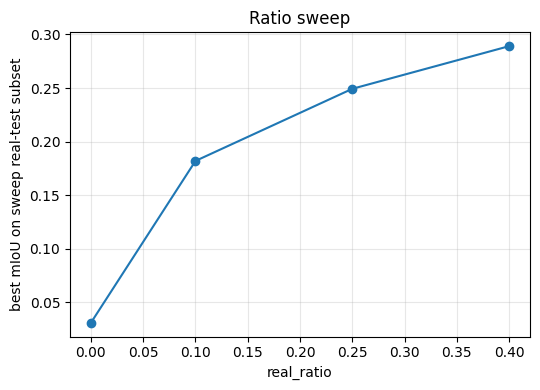

In [13]:
# ============================================================
# 9. Fast ratio sweep
# ============================================================
_, sweep_loader = build_loader(real_test_pairs_for_sweep, augment=False, shuffle=False)

sweep_results = []
for ratio in cfg.candidate_ratios:
    res = run_one_ratio(ratio, sweep_loader)
    sweep_results.append(res)

# sort by best mIoU
sweep_results = sorted(sweep_results, key=lambda x: x["best_miou"], reverse=True)

print("\nSweep summary:")
for r in sweep_results:
    print(f"ratio={r['ratio']:<4}  best_mIoU={r['best_miou']:.4f}  epoch={r['best_epoch']}")

best_ratio = sweep_results[0]["ratio"]
print("\nBest ratio selected =", best_ratio)

# plot ratio sweep
plt.figure(figsize=(6,4))
plt.plot([r["ratio"] for r in sweep_results], [r["best_miou"] for r in sweep_results], marker="o")
plt.xlabel("real_ratio")
plt.ylabel("best mIoU on sweep real-test subset")
plt.title("Ratio sweep")
plt.grid(True, alpha=0.3)
plt.show()

In [14]:
# ============================================================
# 10. Rebuild best model + load best weights
# ============================================================
_, final_eval_loader = build_loader(real_test_pairs_final, augment=False, shuffle=False)

best_run = None
for r in sweep_results:
    if r["ratio"] == best_ratio:
        best_run = r
        break

best_model = DINOv2MultiLayerSeg(
    model_name=cfg.model_name,
    num_classes=cfg.num_classes,
    n_layers=cfg.n_intermediate_layers,
    hidden=cfg.decoder_dim,
    freeze_backbone=cfg.freeze_backbone,
    dropout=cfg.dropout,
    pretrained=True
).to(DEVICE)

best_model.load_state_dict(best_run["best_state"]["model"], strict=True)
best_model.eval()

final_eval = evaluate(best_model, final_eval_loader, collect_sample_stats=True)

print("\nFinal evaluation on selected ratio")
print(f"best_ratio = {best_ratio}")
print(f"mIoU      = {final_eval['miou']:.4f}")
print(f"pixAcc    = {final_eval['pixacc']:.4f}")
print(f"loss      = {final_eval['loss']:.4f}")

# save checkpoint
save_ckpt_path = os.path.join(cfg.out_dir, f"best_ratio_{best_ratio}.pt")
torch.save({
    "ratio": best_ratio,
    "model": best_model.state_dict(),
    "eval": final_eval
}, save_ckpt_path)
print("Saved:", save_ckpt_path)


Loading dinov2_vits14 from torch.hub...


Using cache found in /root/.cache/torch/hub/facebookresearch_dinov2_main


eval:   0%|          | 0/412 [00:00<?, ?it/s]


Final evaluation on selected ratio
best_ratio = 0.4
mIoU      = 0.2891
pixAcc    = 0.8102
loss      = 0.9591
Saved: ./ratio_sweep_outputs/best_ratio_0.4.pt


In [15]:
# ============================================================
# 11. Visualization helpers
# ============================================================
def denorm_img(x_chw: torch.Tensor) -> np.ndarray:
    x = x_chw.detach().cpu().float().numpy()
    x = np.transpose(x, (1,2,0))
    x = x * IMAGENET_STD + IMAGENET_MEAN
    x = np.clip(x, 0, 1)
    return x

def make_colormap(n):
    cmap = plt.get_cmap("tab20", n)
    colors = (cmap(np.arange(n))[:, :3] * 255).astype(np.uint8)
    return colors

COLORS = make_colormap(cfg.num_classes)

def colorize_mask(mask_hw, ignore_index=255):
    h, w = mask_hw.shape
    out = np.zeros((h, w, 3), dtype=np.uint8)
    valid = (mask_hw != ignore_index)
    m = np.clip(mask_hw, 0, cfg.num_classes - 1)
    out[valid] = COLORS[m[valid]]
    return out

def overlay(image_rgb01, mask_rgb255, alpha=0.45):
    mask01 = mask_rgb255.astype(np.float32) / 255.0
    out = (1 - alpha) * image_rgb01 + alpha * mask01
    return np.clip(out, 0, 1)

def compute_error_map(pred, gt, ignore_index=255):
    valid = (gt != ignore_index)
    err = (pred != gt) & valid
    out = np.zeros((gt.shape[0], gt.shape[1], 3), dtype=np.uint8)
    out[..., 0] = err.astype(np.uint8) * 255
    return out

@torch.no_grad()
def predict_from_path(model, img_path):
    img = np.array(Image.open(img_path).convert("RGB"))
    img_r = cv2.resize(img, cfg.target_size, interpolation=cv2.INTER_LINEAR)
    x = img_r.astype(np.float32) / 255.0
    x = (x - IMAGENET_MEAN) / IMAGENET_STD
    x = torch.from_numpy(x.transpose(2,0,1)).unsqueeze(0).float().to(DEVICE)
    logits = model(x)
    pred = logits.argmax(dim=1).squeeze(0).cpu().numpy().astype(np.int64)
    return img_r, pred

def load_gt(mask_path):
    gt = np.array(Image.open(mask_path))
    if gt.ndim == 3:
        gt = gt[..., 0]
    gt = cv2.resize(gt, cfg.target_size, interpolation=cv2.INTER_NEAREST)
    gt = gt.astype(np.int64)
    gt[(gt < 0) | (gt >= cfg.num_classes)] = cfg.ignore_index
    return gt


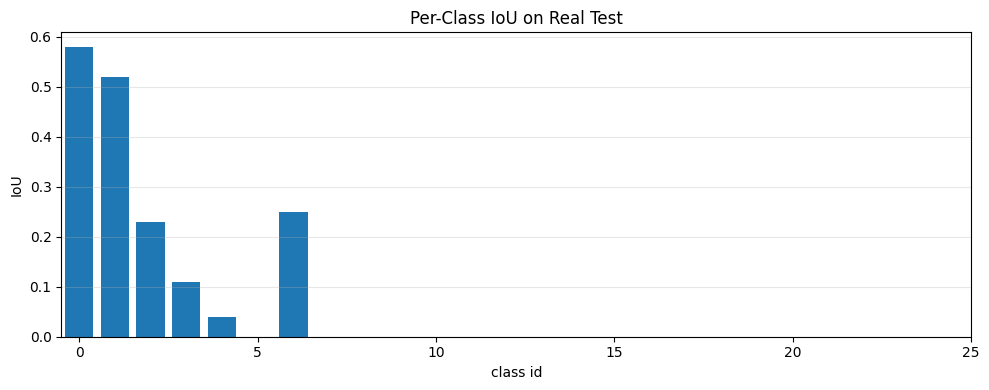

class dist:   0%|          | 0/300 [00:00<?, ?it/s]

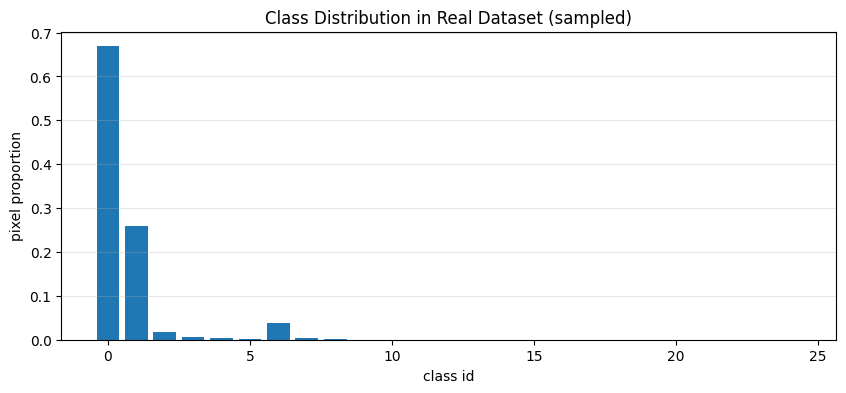

In [16]:
# ============================================================
# 12. Per-class IoU plot
# ============================================================
per_iou = final_eval["per_iou"]
valid = final_eval["valid"]

valid_idx = np.where(valid)[0]
valid_iou = per_iou[valid]

plt.figure(figsize=(10,4))
plt.bar(valid_idx, valid_iou)
plt.xlabel("class id")
plt.ylabel("IoU")
plt.title("Per-Class IoU on Real Test")
plt.grid(True, axis="y", alpha=0.3)
plt.show()

# ============================================================
# 13. Class distribution plot on real test
# ============================================================
def class_distribution_from_pairs(pairs, num_classes, ignore_index=255, max_n=300):
    pairs = subset_pairs(pairs, max_n=max_n, seed=SEED)
    counts = np.zeros(num_classes, dtype=np.int64)
    for _, mask_path in tqdm(pairs, desc="class dist"):
        m = np.array(Image.open(mask_path))
        if m.ndim == 3:
            m = m[..., 0]
        vals, cnts = np.unique(m, return_counts=True)
        for v, c in zip(vals, cnts):
            if v != ignore_index and 0 <= v < num_classes:
                counts[v] += c
    return counts

real_dist = class_distribution_from_pairs(real_test_pairs_final, cfg.num_classes, cfg.ignore_index, max_n=300)
real_dist_norm = real_dist / np.maximum(real_dist.sum(), 1)

plt.figure(figsize=(10,4))
plt.bar(np.arange(cfg.num_classes), real_dist_norm)
plt.xlabel("class id")
plt.ylabel("pixel proportion")
plt.title("Class Distribution in Real Dataset (sampled)")
plt.grid(True, axis="y", alpha=0.3)
plt.show()


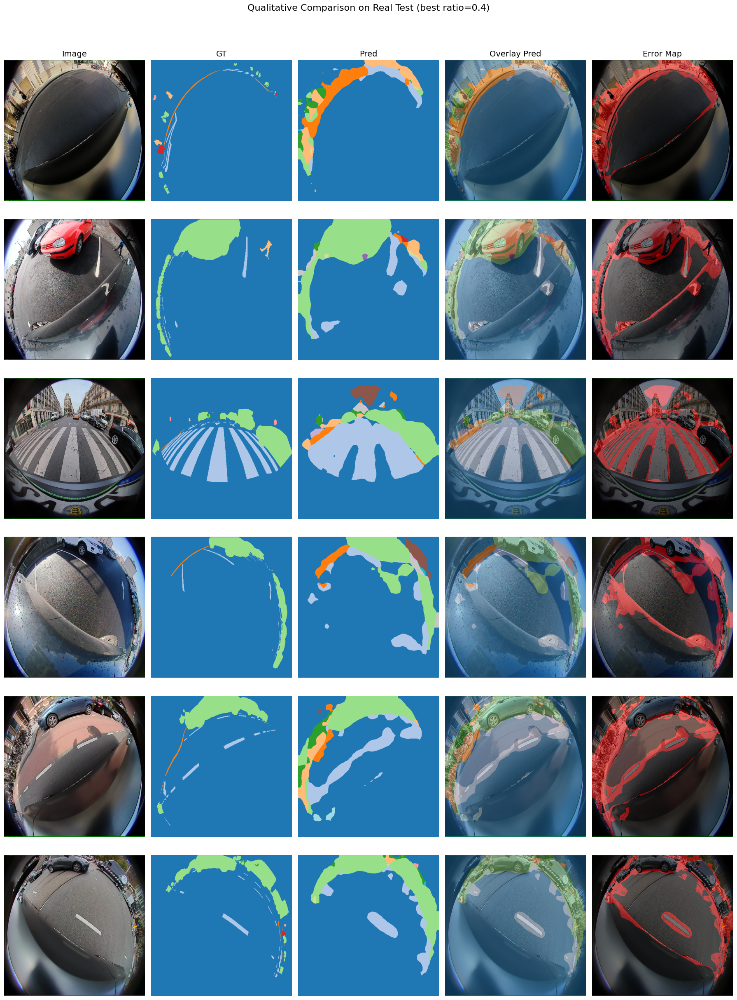

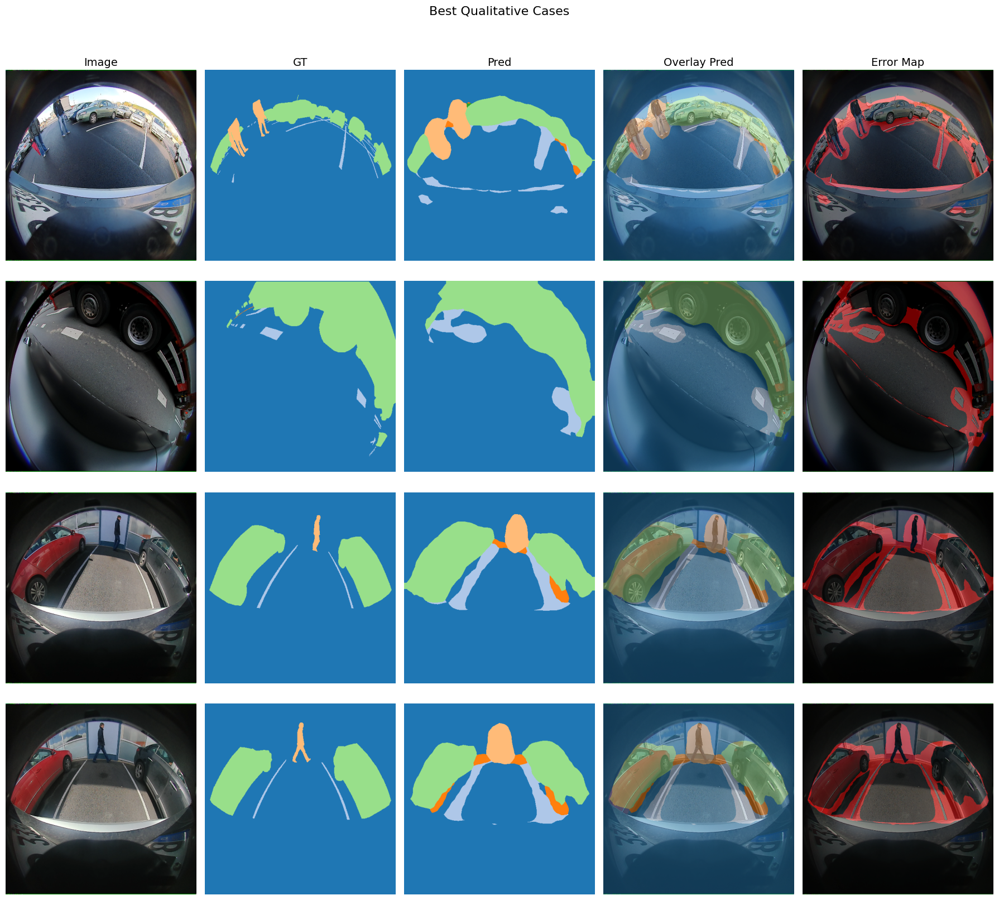

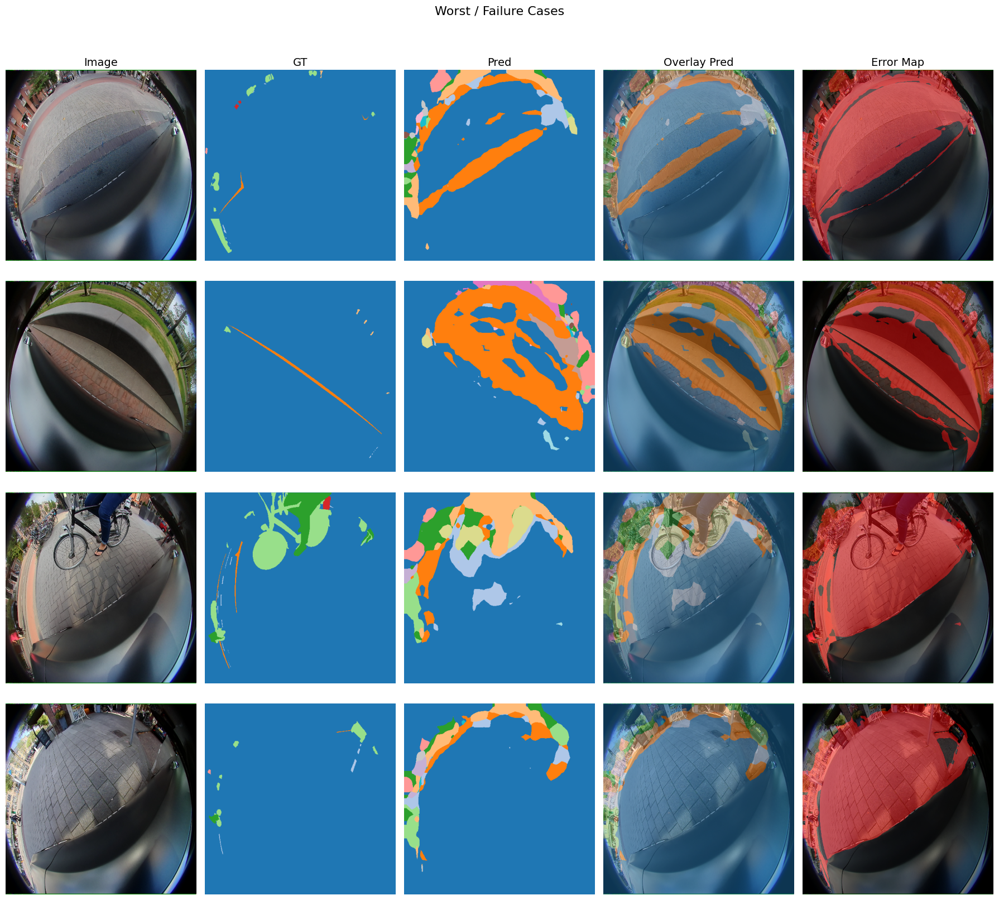

In [17]:
# ============================================================
# 14. Qualitative comparison: Image / GT / Pred / Overlay / Error
# ============================================================
def show_qualitative_grid(model, pairs, title, k=6, seed=42):
    pairs = subset_pairs(pairs, max_n=k, seed=seed)

    fig, axes = plt.subplots(len(pairs), 5, figsize=(18, 4*len(pairs)))
    if len(pairs) == 1:
        axes = np.expand_dims(axes, axis=0)

    col_titles = ["Image", "GT", "Pred", "Overlay Pred", "Error Map"]
    for j, t in enumerate(col_titles):
        axes[0, j].set_title(t, fontsize=14)

    for i, (img_path, mask_path) in enumerate(pairs):
        img_r, pred = predict_from_path(model, str(img_path))
        gt = load_gt(str(mask_path))

        gt_rgb = colorize_mask(gt, ignore_index=cfg.ignore_index)
        pred_rgb = colorize_mask(pred, ignore_index=cfg.ignore_index)
        ov = overlay(img_r.astype(np.float32)/255.0, pred_rgb, alpha=0.45)
        err = compute_error_map(pred, gt, ignore_index=cfg.ignore_index)

        axes[i, 0].imshow(img_r)
        axes[i, 1].imshow(gt_rgb)
        axes[i, 2].imshow(pred_rgb)
        axes[i, 3].imshow(ov)
        axes[i, 4].imshow(img_r)
        axes[i, 4].imshow(err, alpha=0.45)

        for j in range(5):
            axes[i, j].axis("off")

    fig.suptitle(title, fontsize=16, y=1.02)
    fig.tight_layout()
    plt.show()

show_qualitative_grid(
    model=best_model,
    pairs=real_test_pairs_final,
    title=f"Qualitative Comparison on Real Test (best ratio={best_ratio})",
    k=6,
    seed=123
)

# ============================================================
# 15. Best / Worst cases by sample IoU
# ============================================================
sample_stats = final_eval["sample_stats"]
sample_stats_sorted = sorted(sample_stats, key=lambda x: (np.nan_to_num(x["sample_iou"], nan=-1.0)))

worst_cases = sample_stats_sorted[:4]
best_cases = sample_stats_sorted[-4:]

def show_cases(case_list, title):
    fig, axes = plt.subplots(len(case_list), 5, figsize=(18, 4*len(case_list)))
    if len(case_list) == 1:
        axes = np.expand_dims(axes, axis=0)

    headers = ["Image", "GT", "Pred", "Overlay Pred", "Error Map"]
    for j, t in enumerate(headers):
        axes[0, j].set_title(t, fontsize=14)

    for i, item in enumerate(case_list):
        img_path = item["img_path"]
        mask_path = item["mask_path"]
        img_r, pred = predict_from_path(best_model, img_path)
        gt = load_gt(mask_path)

        gt_rgb = colorize_mask(gt, ignore_index=cfg.ignore_index)
        pred_rgb = colorize_mask(pred, ignore_index=cfg.ignore_index)
        ov = overlay(img_r.astype(np.float32)/255.0, pred_rgb, alpha=0.45)
        err = compute_error_map(pred, gt, ignore_index=cfg.ignore_index)

        axes[i, 0].imshow(img_r)
        axes[i, 1].imshow(gt_rgb)
        axes[i, 2].imshow(pred_rgb)
        axes[i, 3].imshow(ov)
        axes[i, 4].imshow(img_r)
        axes[i, 4].imshow(err, alpha=0.45)

        axes[i, 0].set_ylabel(f"IoU={item['sample_iou']:.3f}", fontsize=11)

        for j in range(5):
            axes[i, j].axis("off")

    fig.suptitle(title, fontsize=16, y=1.02)
    fig.tight_layout()
    plt.show()

show_cases(best_cases, "Best Qualitative Cases")
show_cases(worst_cases, "Worst / Failure Cases")


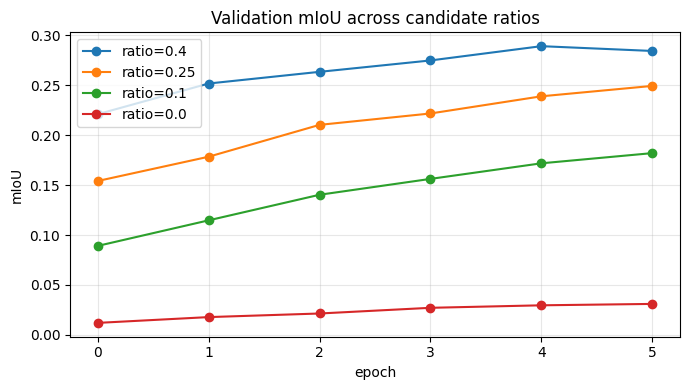

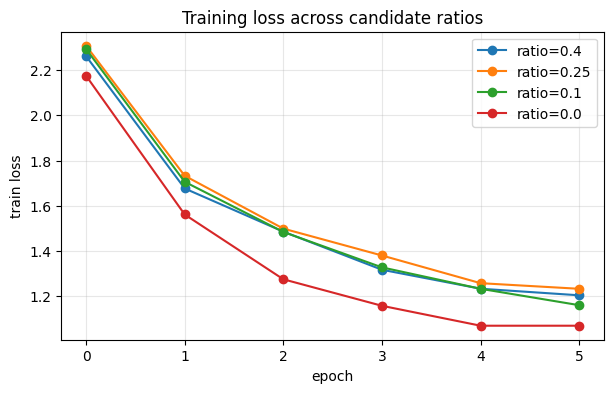

In [18]:
# ============================================================
# 16. Ratio comparison curves
# ============================================================
plt.figure(figsize=(7,4))
for r in sweep_results:
    plt.plot(r["history"]["epoch"], r["history"]["val_miou"], marker="o", label=f"ratio={r['ratio']}")
plt.xlabel("epoch")
plt.ylabel("mIoU")
plt.title("Validation mIoU across candidate ratios")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

plt.figure(figsize=(7,4))
for r in sweep_results:
    plt.plot(r["history"]["epoch"], r["history"]["train_loss"], marker="o", label=f"ratio={r['ratio']}")
plt.xlabel("epoch")
plt.ylabel("train loss")
plt.title("Training loss across candidate ratios")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()